# Medición de distancias — bordes de corte → borde inferior de la mesa

**Pipeline:**
1. Une los centros de los QRs (triángulo de calibración)
2. Traza la línea horizontal de referencia en BL (borde inferior de la mesa)
3. Re-segmenta los bordes de corte con EfficientSAM
4. Mide la distancia en mm desde cada segmentación hasta la línea BL

## 1. Importaciones y configuración

In [7]:
import json
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from pathlib import Path

# ── Escala métrica del espacio canónico ─────────────────────────────────────
# H mapea imagen → canvas (1000 × 1400 px) con:
#   TL→(0,0)  TR→(1000,0)  BL→(0,1400)
# Cateto TL-TR = 800 mm → scale_x = 800/1000 = 0.8  mm/px canónico
# Cateto TR-BL = 800 mm → scale_y = 800/1400 ≈ 0.571 mm/px canónico
CANONICAL_W = 1000
CANONICAL_H = 1400
CATETO_MM   = 800
SCALE_X = CATETO_MM / CANONICAL_W
SCALE_Y = CATETO_MM / CANONICAL_H

# ── Rutas ───────────────────────────────────────────────────────────────────
QR_JSON         = Path("../outputs/detections/qr_homographies.json")
CUTEDGE_JSON    = Path("../outputs/detections/cut_edge_detections.json")
RAW_DIR         = Path("../data/raw")
ESAM_WEIGHTS    = Path("efficient_sam_vitt.pt")
OUT_DIR         = Path("../outputs/figures/cut_edge_distances")
OUT_DIR.mkdir(parents=True, exist_ok=True)

with open(QR_JSON)      as f: qr_data   = json.load(f)
with open(CUTEDGE_JSON) as f: cut_edges = json.load(f)

print(f"QR data:       {len(qr_data)} imágenes")
print(f"Cut-edge data: {len(cut_edges)} imágenes")
print(f"SCALE_Y = {SCALE_Y:.4f} mm/px canónico")

QR data:       20 imágenes
Cut-edge data: 22 imágenes
SCALE_Y = 0.5714 mm/px canónico


## 2. Cargar EfficientSAM

In [8]:
from efficient_sam.efficient_sam import build_efficient_sam

sam = build_efficient_sam(
    encoder_patch_embed_dim=192,
    encoder_num_heads=3,
    checkpoint=str(ESAM_WEIGHTS),
)
sam.eval()
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
sam = sam.to(DEVICE)
print(f"EfficientSAM listo en {DEVICE}")

c:\Users\jaime\anaconda3\envs\VA\Lib\site-packages\efficient_sam\efficient_sam.py:303: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f, map_location=

EfficientSAM listo en cuda


## 3. Funciones auxiliares

In [9]:
def run_esam(image_np, box_xyxy, pad=15):
    """Devuelve máscara booleana (H×W) para la bbox dada."""
    H, W = image_np.shape[:2]
    x1, y1, x2, y2 = [int(v) for v in box_xyxy]
    x1p = max(0, x1 - pad); y1p = max(0, y1 - pad)
    x2p = min(W, x2 + pad); y2p = min(H, y2 + pad)
    crop = image_np[y1p:y2p, x1p:x2p]

    bx1, by1 = float(x1 - x1p), float(y1 - y1p)
    bx2, by2 = float(x2 - x1p), float(y2 - y1p)

    img_t = torch.from_numpy(crop).permute(2, 0, 1).float() / 255.0
    img_t = img_t.unsqueeze(0).to(DEVICE)
    pts   = torch.tensor([[[[bx1, by1], [bx2, by2]]]], dtype=torch.float32).to(DEVICE)
    lbl   = torch.tensor([[[2, 3]]],                   dtype=torch.int32).to(DEVICE)

    with torch.no_grad():
        masks, scores = sam(img_t, pts, lbl)

    best      = scores[0, 0].argmax().item()
    crop_mask = masks[0, 0, best].cpu().numpy() > 0.5
    full_mask = np.zeros((H, W), dtype=bool)
    full_mask[y1p:y2p, x1p:x2p] = crop_mask
    return full_mask


def apply_H(H_mat, pts):
    """Proyecta puntos (N×2) imagen → espacio canónico."""
    H_mat = np.array(H_mat, dtype=np.float64)
    pts   = np.atleast_2d(pts).astype(np.float64)
    hom   = np.hstack([pts, np.ones((len(pts), 1))])
    proj  = (H_mat @ hom.T).T
    return proj[:, :2] / proj[:, 2:3]


def mask_bottom_point(mask):
    """Devuelve el punto más bajo de la máscara (fila máxima) y su x central."""
    rows = np.any(mask, axis=1)
    if not rows.any():
        return None
    y_bot = int(np.where(rows)[0].max())
    cols  = np.where(mask[y_bot])[0]
    x_mid = int(cols.mean())
    return (x_mid, y_bot)


print("Helpers listos.")

Helpers listos.


## 4. Test en una imagen

  Borde #1 (conf=0.92): fondo en (325,1140)px → 93.6 mm hasta BL
  Borde #2 (conf=0.90): fondo en (335,550)px → 470.2 mm hasta BL
  Borde #3 (conf=0.73): fondo en (335,549)px → 470.8 mm hasta BL


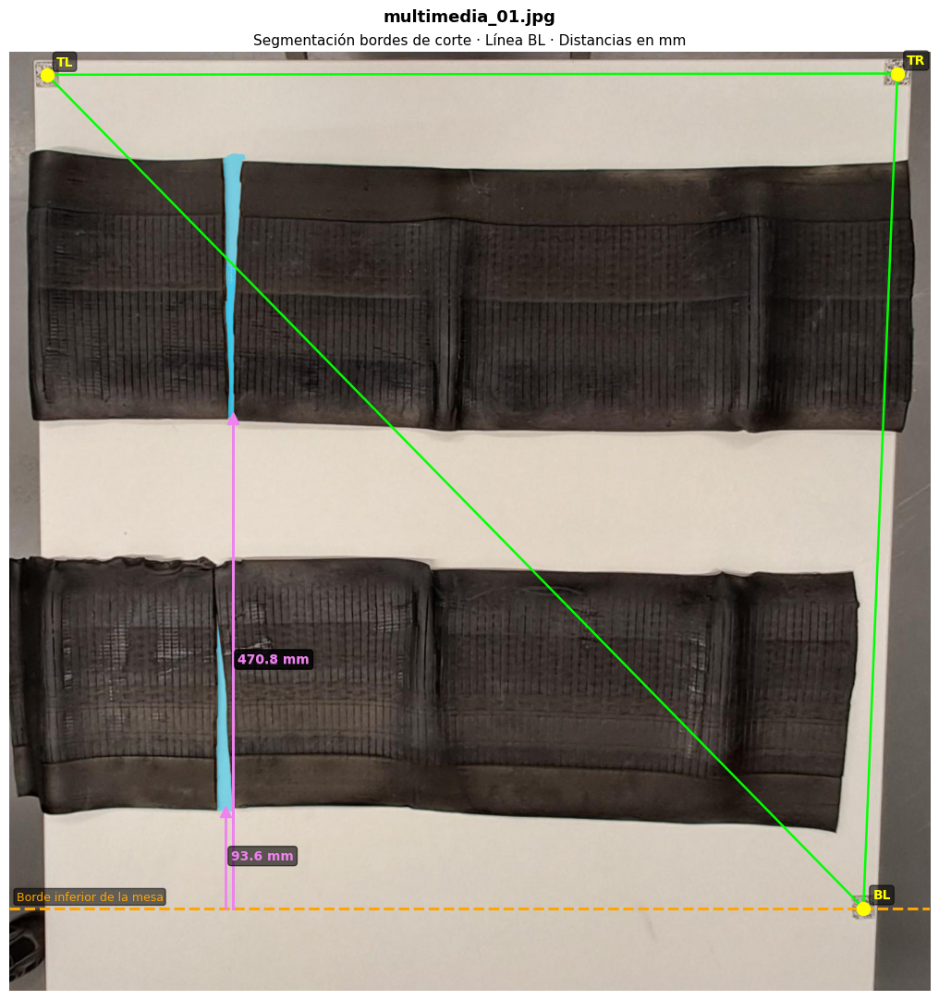

In [10]:
TARGET = "multimedia_01.jpg"

img_bgr = cv2.imread(str(RAW_DIR / TARGET))
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
iH, iW  = img_rgb.shape[:2]

H_mat      = qr_data[TARGET]["H"]
qr_centers = qr_data[TARGET]["qrs"]
detections = cut_edges.get(TARGET, [])

BL_x, BL_y = qr_centers["BL"]

# ── Segmentar bordes de corte ────────────────────────────────────────────────
COLOR_MASK = np.array([0, 200, 255], dtype=np.uint8)   # cian
ALPHA      = 0.45

overlay = img_rgb.copy().astype(np.float32)
masks   = []
for det in detections:
    mask = run_esam(img_rgb, det["bbox"])
    masks.append(mask)
    colored = np.zeros_like(overlay)
    colored[mask] = COLOR_MASK
    overlay = np.where(mask[:, :, None],
                       overlay * (1 - ALPHA) + colored * ALPHA, overlay)

overlay = overlay.astype(np.uint8)

# ── Visualización ────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(11, 11))
ax.imshow(overlay)

# 1) Triángulo QR
order = ["TL", "TR", "BL", "TL"]
for a, b in zip(order, order[1:]):
    if a in qr_centers and b in qr_centers:
        ax.plot([qr_centers[a][0], qr_centers[b][0]],
                [qr_centers[a][1], qr_centers[b][1]],
                color="lime", lw=1.8, zorder=3)
for lbl, (cx, cy) in qr_centers.items():
    ax.plot(cx, cy, "o", color="yellow", ms=10, zorder=5)
    ax.text(cx + 14, cy - 14, lbl, color="yellow", fontsize=10, fontweight="bold",
            bbox=dict(boxstyle="round,pad=0.25", fc="black", alpha=0.55))

# 2) Línea horizontal de referencia en BL (borde inferior de la mesa)
ax.axhline(BL_y, color="orange", lw=2.2, linestyle="--", label="Borde inferior (BL)")
ax.text(10, BL_y - 12, "Borde inferior de la mesa", color="orange",
        fontsize=9, bbox=dict(boxstyle="round,pad=0.2", fc="black", alpha=0.55))

# 3) Distancias por máscara
for i, (mask, det) in enumerate(zip(masks, detections)):
    pt = mask_bottom_point(mask)
    if pt is None:
        continue
    px, py = pt

    # Convertir a espacio canónico y calcular mm
    canon = apply_H(H_mat, [[px, py]])[0]
    dist_mm = max(0.0, (CANONICAL_H - canon[1]) * SCALE_Y)

    # Línea vertical desde el fondo de la máscara hasta la línea BL
    ax.plot([px, px], [py, BL_y], color="violet", lw=2, linestyle="-", zorder=4)
    ax.plot(px, py, "^", color="violet", ms=8, zorder=6)

    # Etiqueta con la distancia
    mid_y = (py + BL_y) / 2
    ax.text(px + 8, mid_y, f"{dist_mm:.1f} mm",
            color="violet", fontsize=10, fontweight="bold",
            bbox=dict(boxstyle="round,pad=0.25", fc="black", alpha=0.6), zorder=7)

    print(f"  Borde #{i+1} (conf={det['conf']:.2f}): fondo en ({px},{py})px → {dist_mm:.1f} mm hasta BL")

ax.set_title("Segmentación bordes de corte · Línea BL · Distancias en mm", fontsize=11)
ax.axis("off")
fig.suptitle(TARGET, fontsize=13, fontweight="bold")
plt.tight_layout()
plt.show()

## 5. Procesar todas las imágenes

Imagen                     Borde  conf   dist_BL (mm)
----------------------------------------------------------
multimedia_01.jpg             #1  0.92           93.6
multimedia_01.jpg             #2  0.90          470.2
multimedia_01.jpg             #3  0.73          470.8


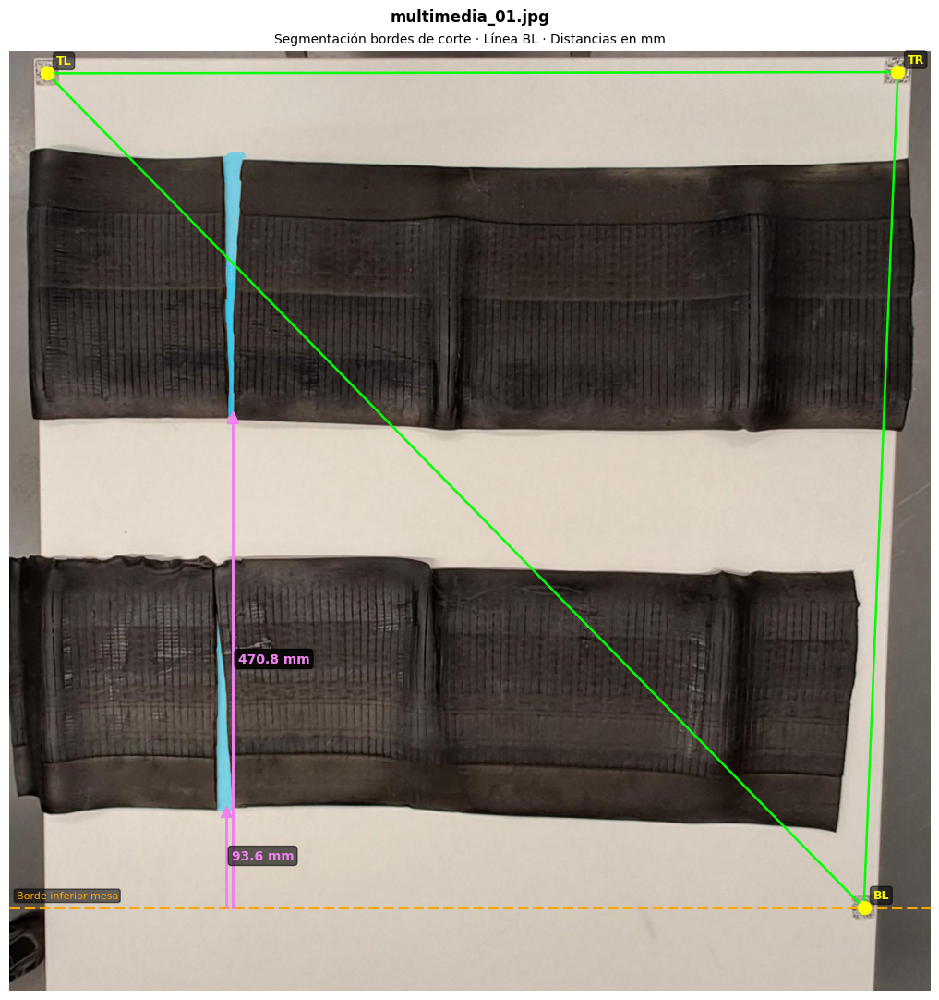

multimedia_02.jpg             #1  0.86          541.2
multimedia_02.jpg             #2  0.84          153.2


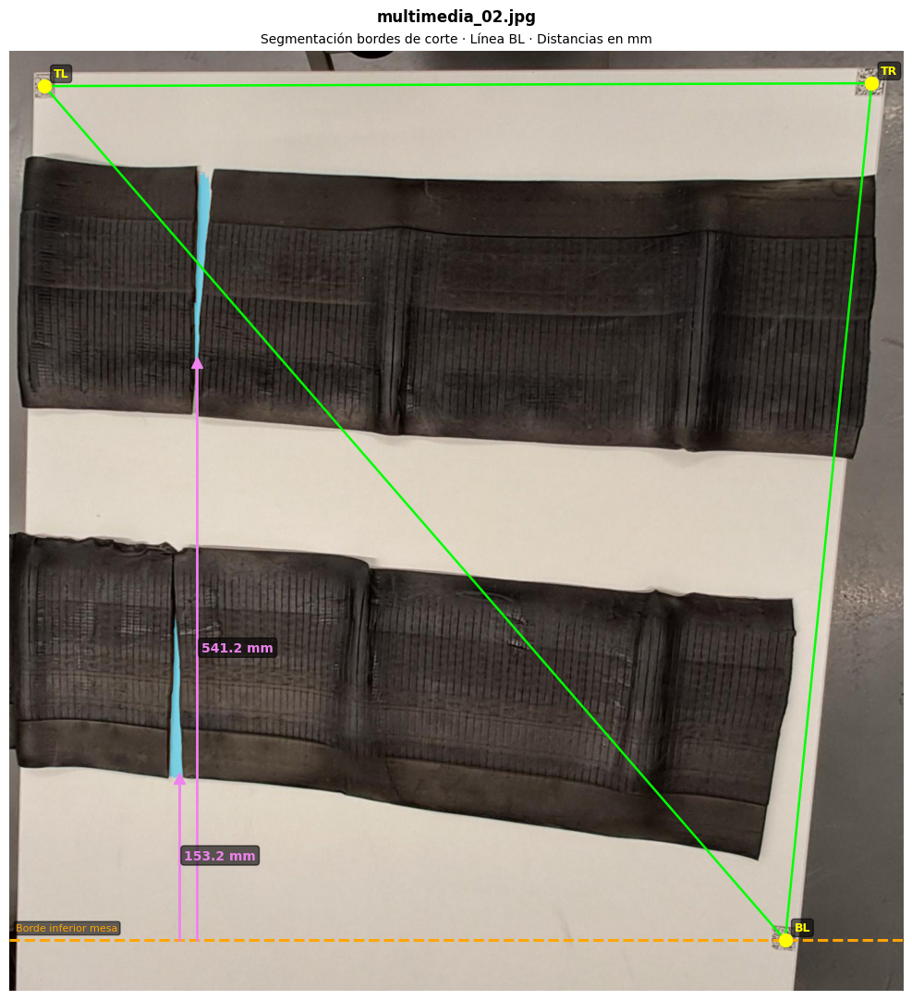

multimedia_03.jpg             #1  0.97          462.4
multimedia_03.jpg             #2  0.95           76.7


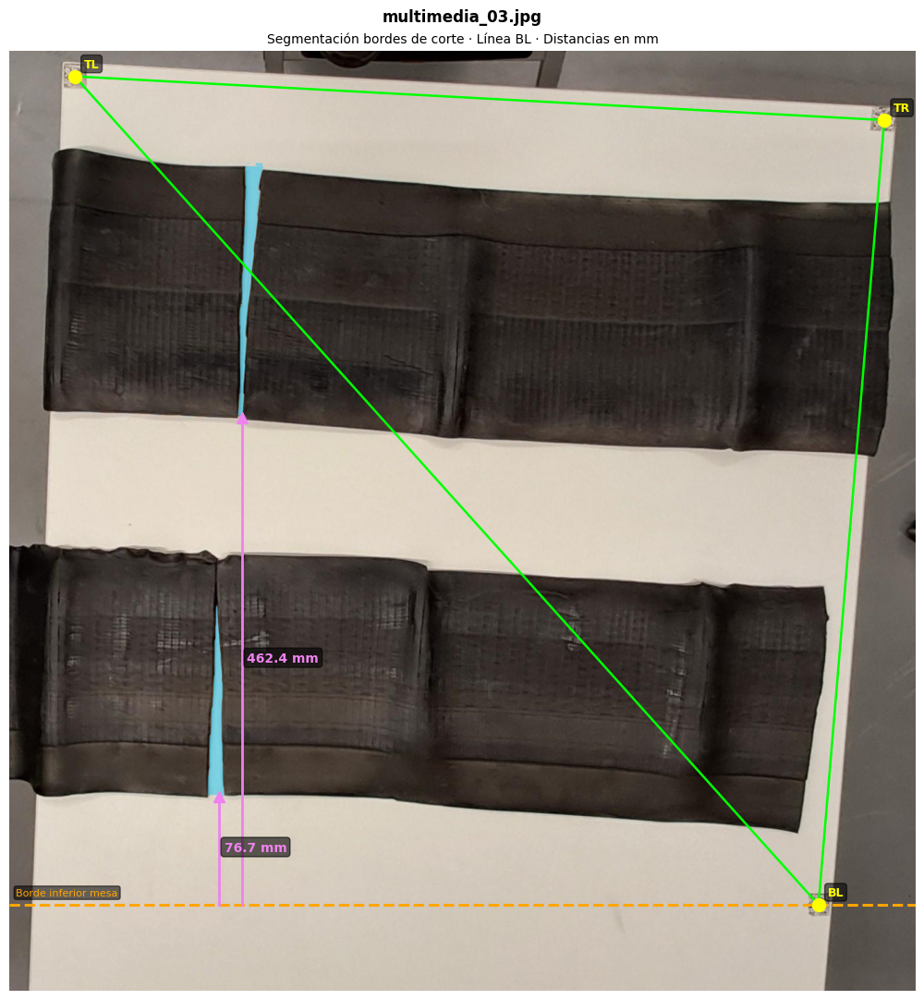

multimedia_04.jpg             #1  0.96          483.0
multimedia_04.jpg             #2  0.84          118.0


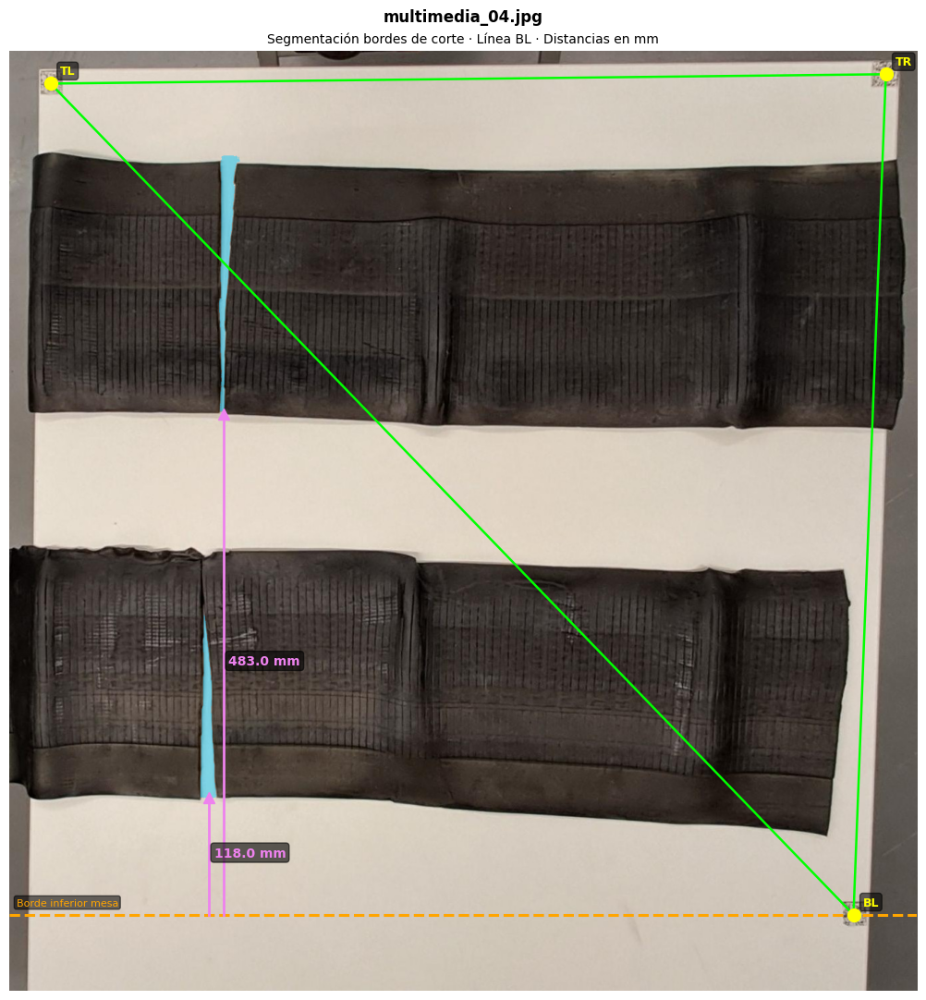

multimedia_05.jpg             #1  1.00          174.1
multimedia_05.jpg             #2  1.00          183.4


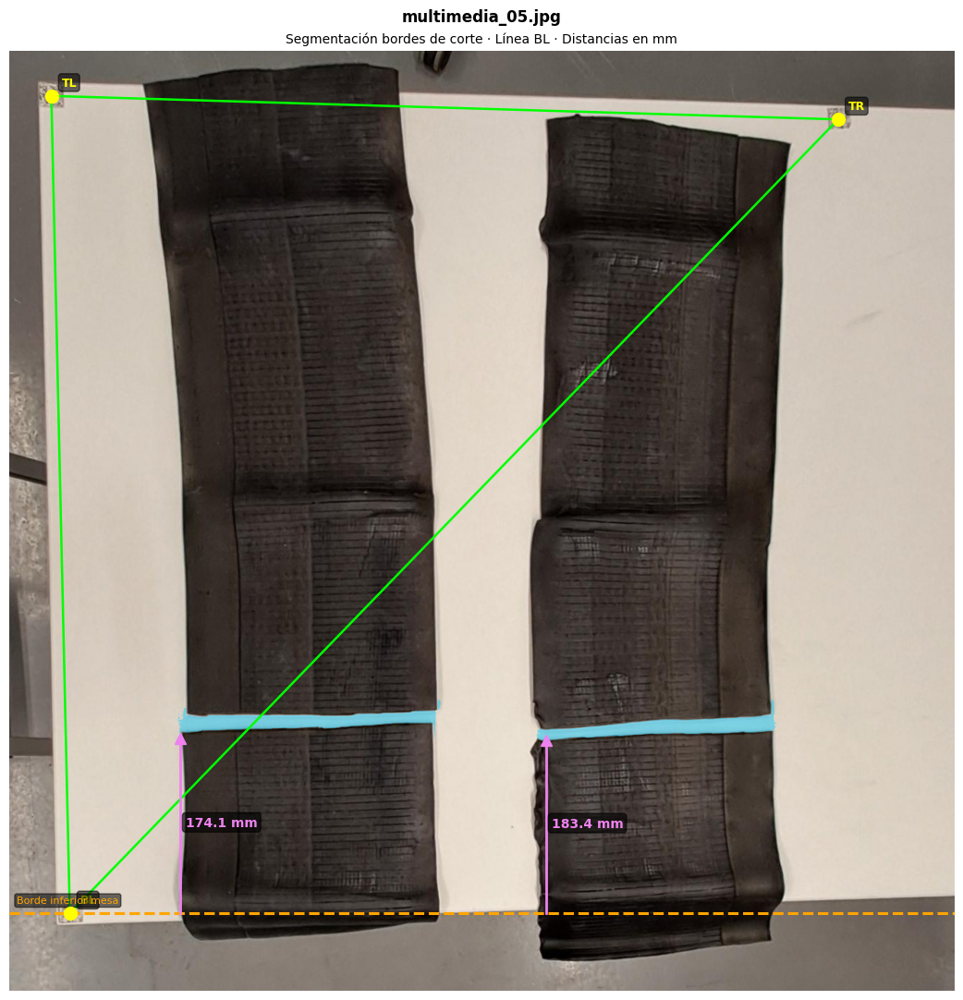

multimedia_06.jpg             #1  0.94          179.9
multimedia_06.jpg             #2  0.87          169.4


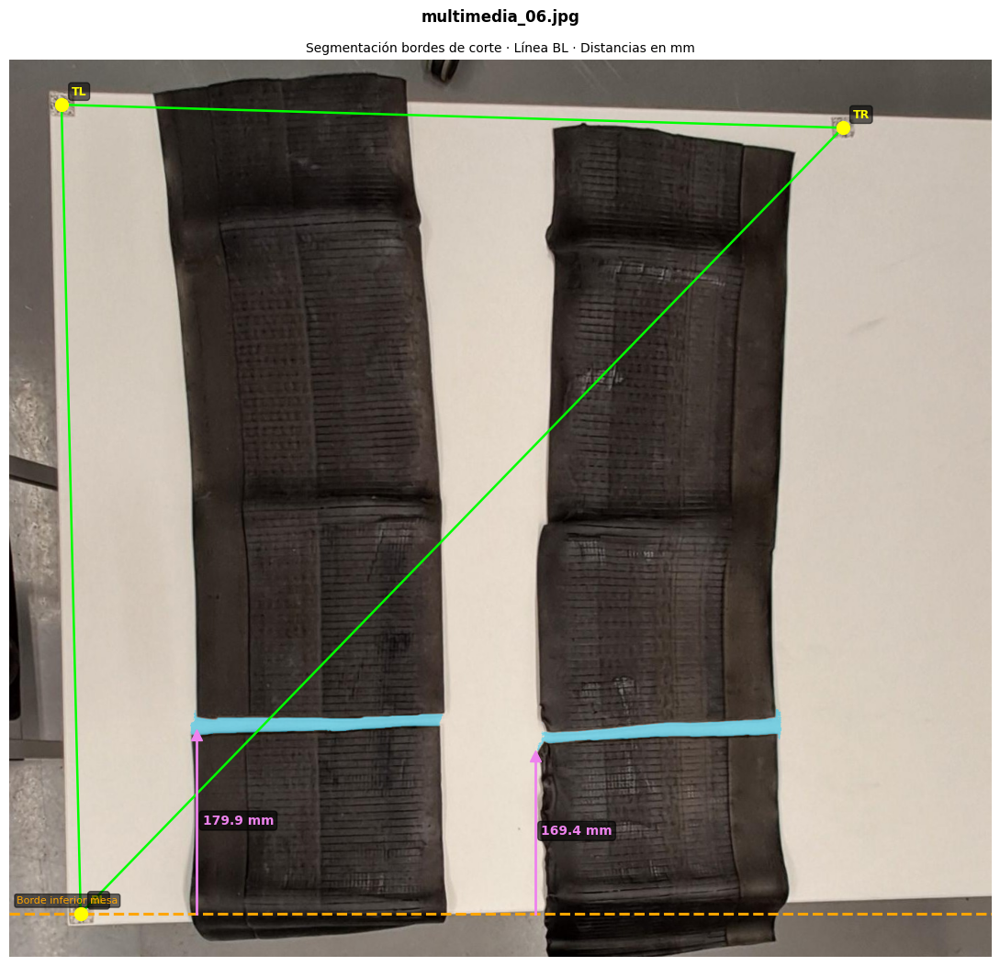

multimedia_07.jpg             #1  1.00          178.3
multimedia_07.jpg             #2  0.92          188.5


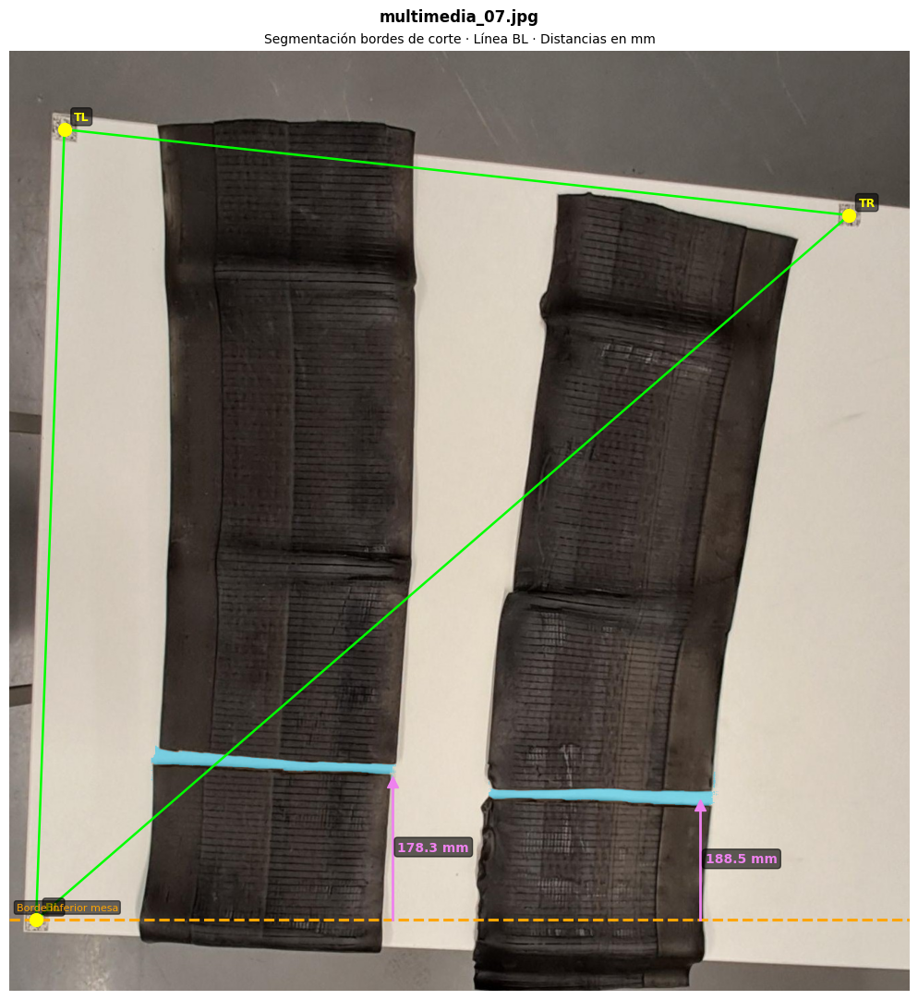

multimedia_09.jpg             #1  0.94          123.5
multimedia_09.jpg             #2  0.81          512.4


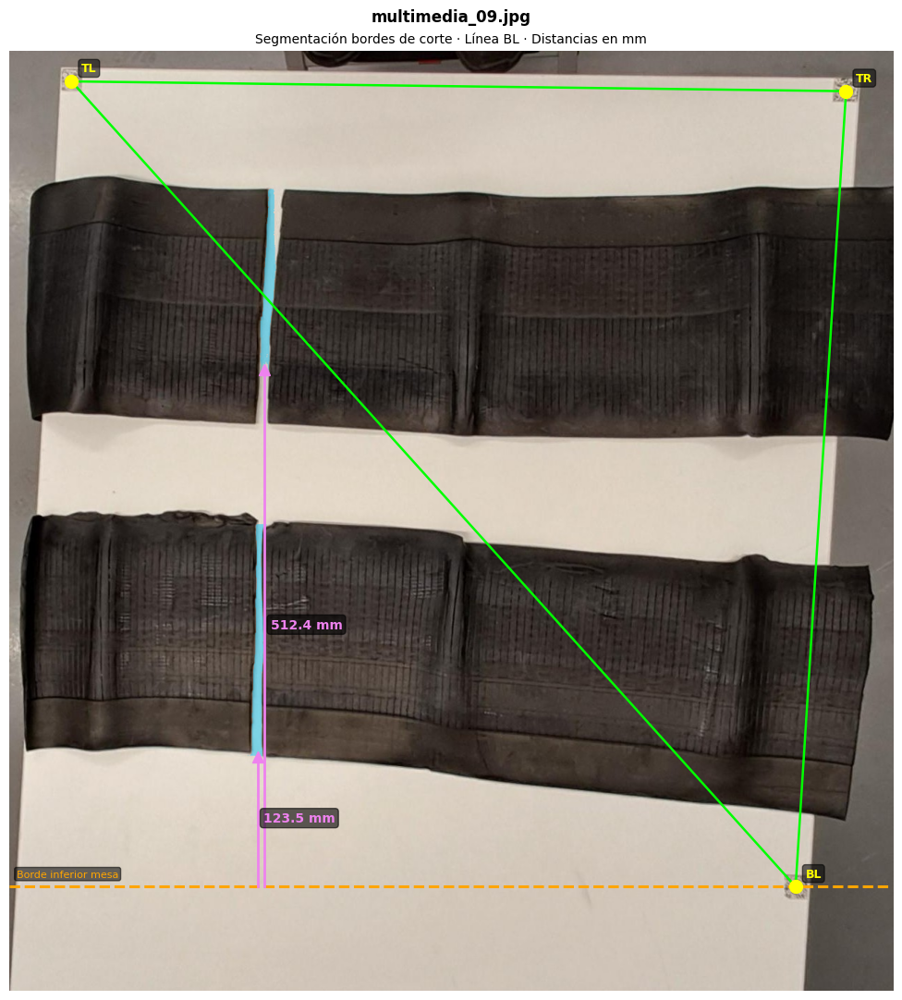

multimedia_10.jpg             #1  0.92          459.5
multimedia_10.jpg             #2  0.86          178.1
multimedia_10.jpg             #3  0.84          114.2


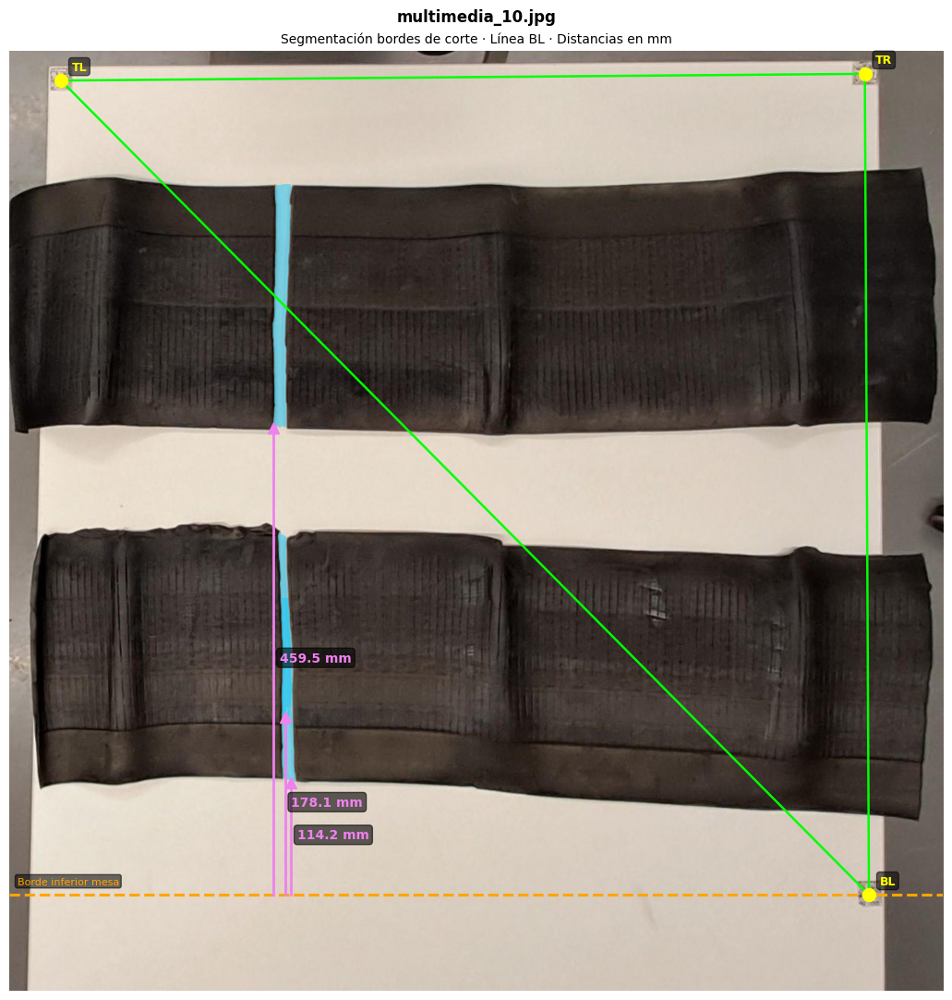

multimedia_11.jpg             #1  0.92          191.9
multimedia_11.jpg             #2  0.89          526.9
multimedia_11.jpg             #3  0.73          483.0


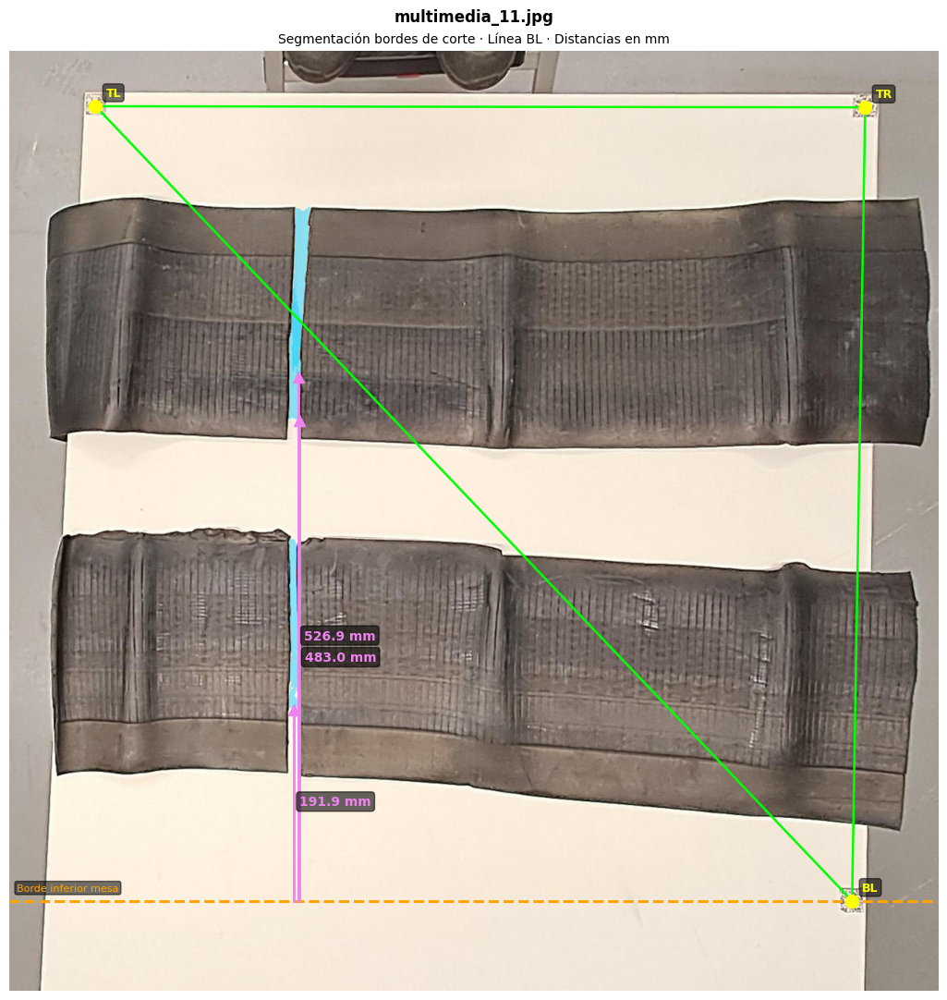

multimedia_12.jpg             #1  0.96          448.1
multimedia_12.jpg             #2  0.77           62.6


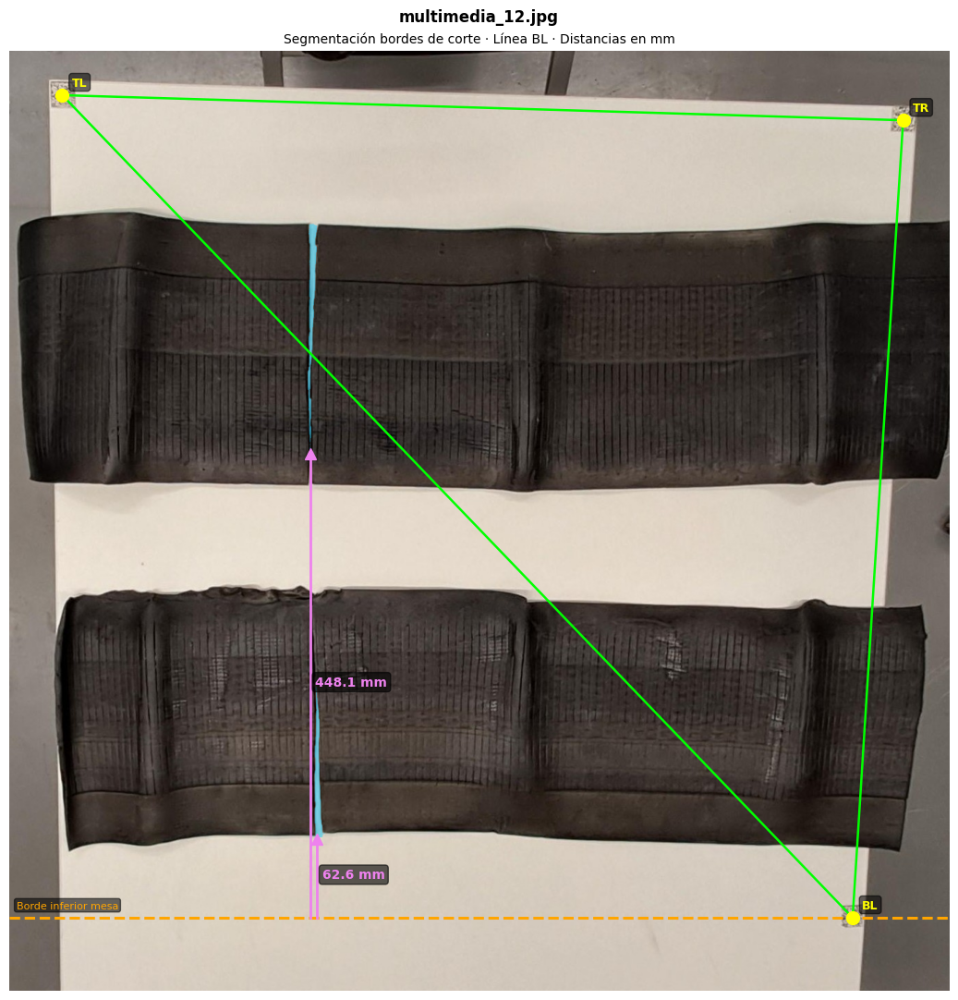

multimedia_13.jpg             #1  0.98            0.0
multimedia_13.jpg             #2  0.66          479.0


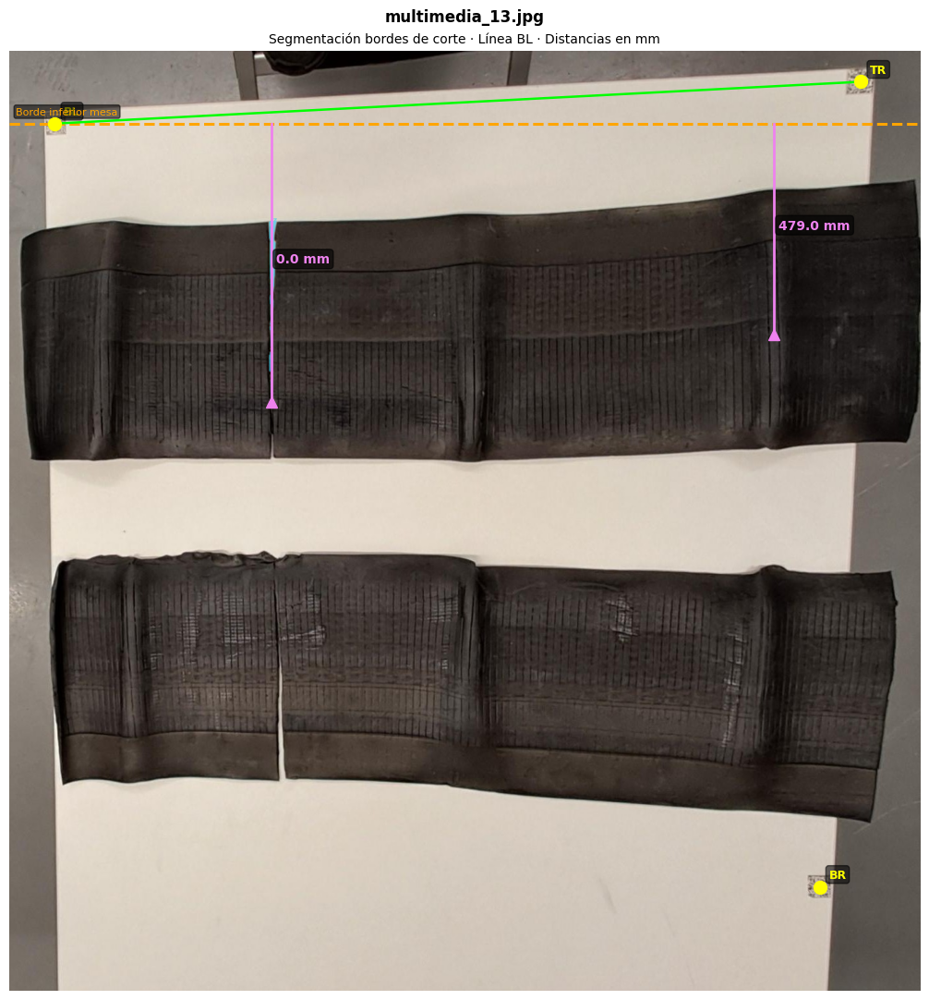

multimedia_15.jpg             #1  1.00          209.7
multimedia_15.jpg             #2  0.95          224.6
multimedia_15.jpg             #3  0.87          450.0


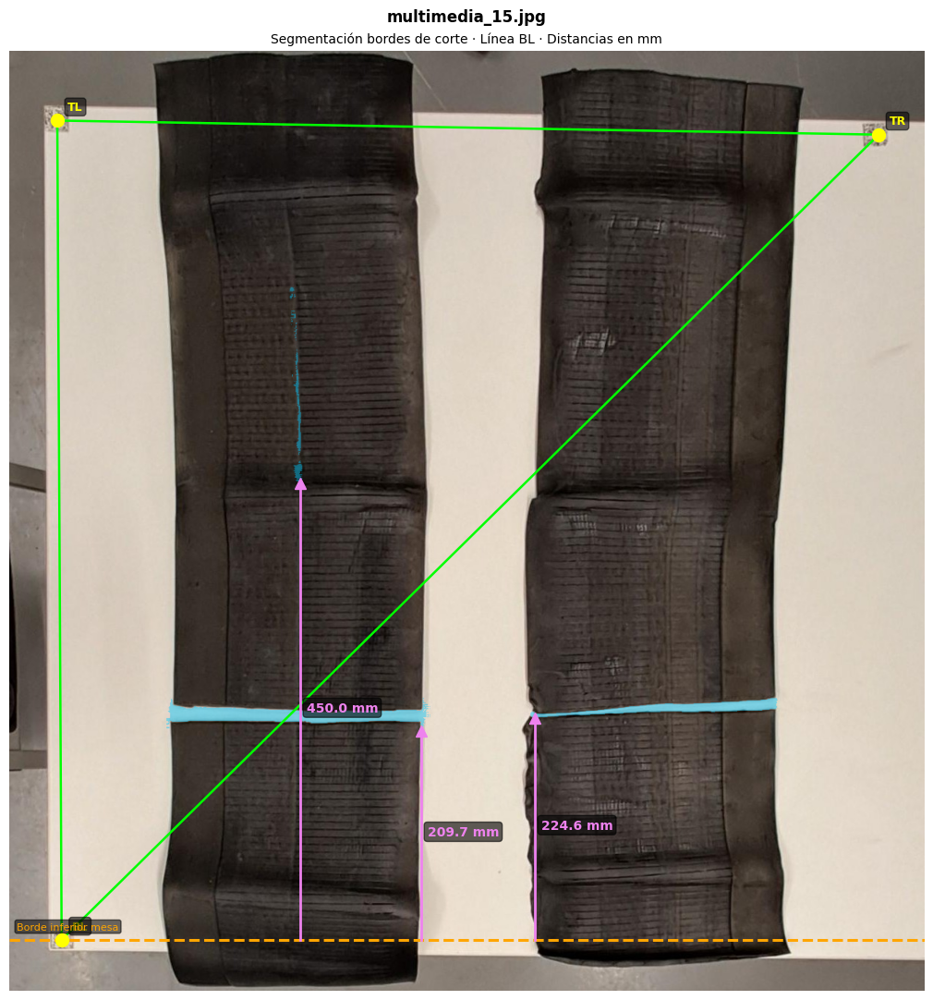

multimedia_16.jpg             #1  0.99          199.7
multimedia_16.jpg             #2  0.99          206.4


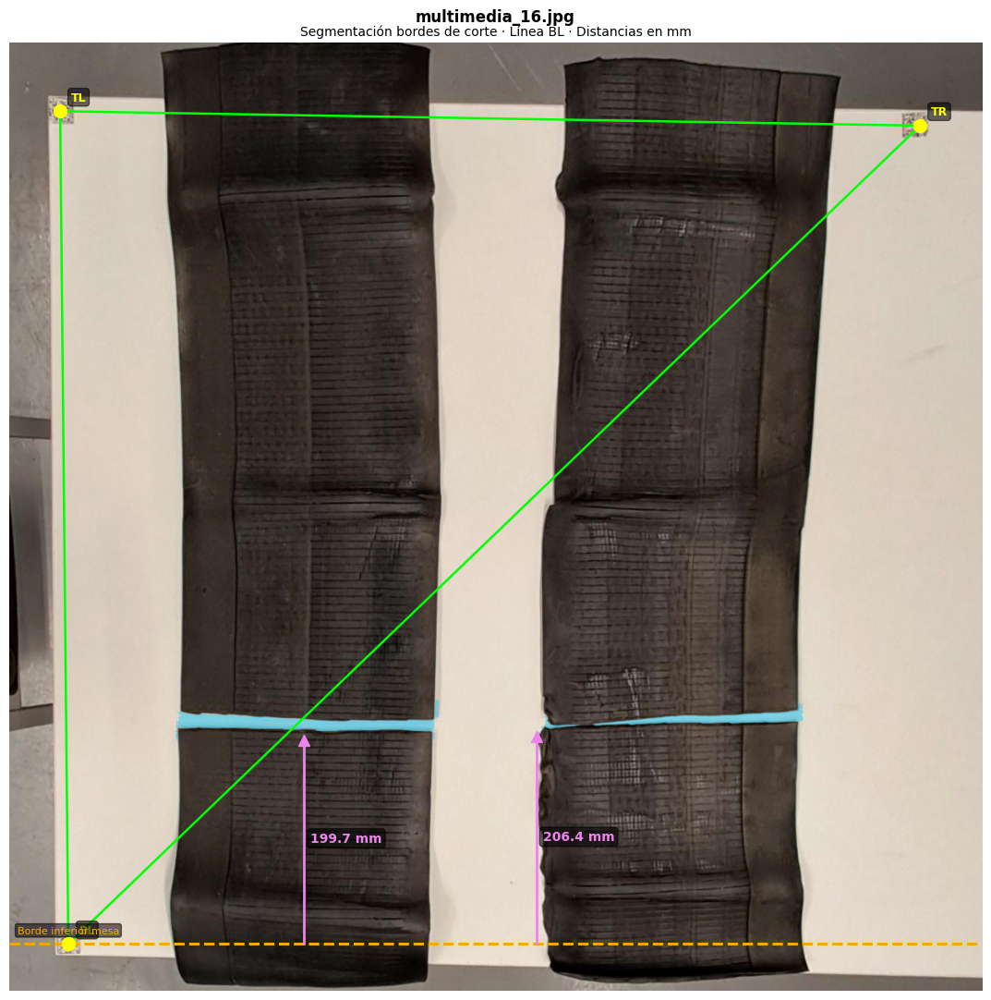

multimedia_17.jpg             #1  0.99          205.3
multimedia_17.jpg             #2  0.95          234.0


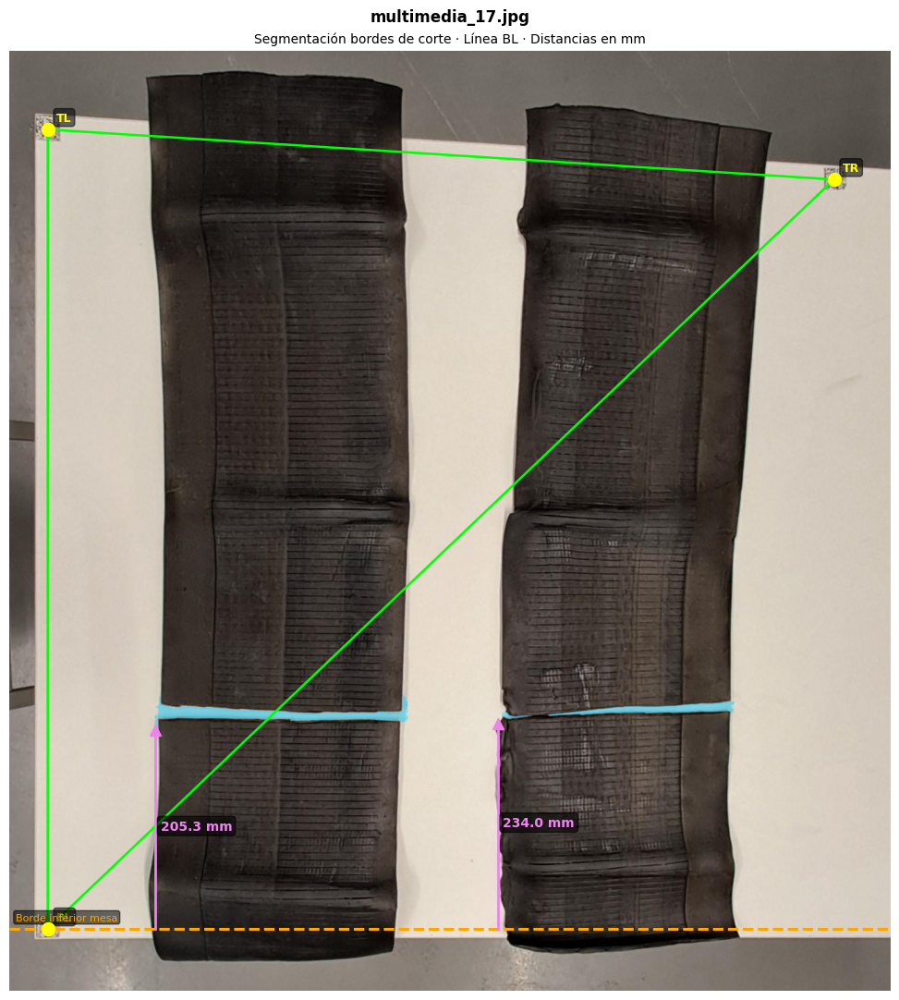

multimedia_19.jpg             #1  0.79            0.0


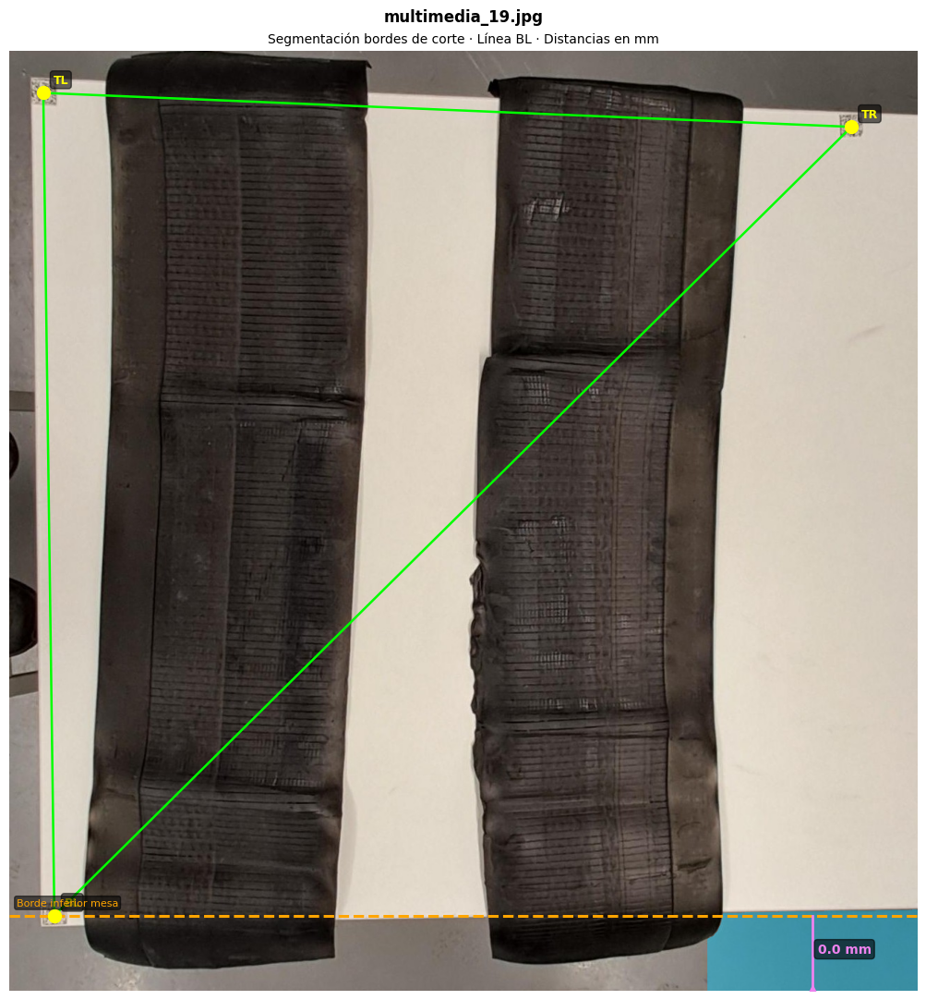


Guardado en: C:\Users\jaime\Proyectos\VA_RetoMichelin\models\Jaime\outputs\figures\cut_edge_distances


In [11]:
print(f"{'Imagen':<25} {'Borde':>6} {'conf':>5}  {'dist_BL (mm)':>13}")
print("-" * 58)

for img_name in sorted(qr_data.keys()):
    if img_name not in cut_edges or not cut_edges[img_name]:
        continue

    img_bgr = cv2.imread(str(RAW_DIR / img_name))
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    H_mat      = qr_data[img_name]["H"]
    qr_centers = qr_data[img_name]["qrs"]
    detections = cut_edges[img_name]
    BL_x, BL_y = qr_centers["BL"]

    COLOR_MASK = np.array([0, 200, 255], dtype=np.uint8)
    ALPHA      = 0.45
    overlay    = img_rgb.copy().astype(np.float32)
    results_img = []

    for det in detections:
        try:
            mask = run_esam(img_rgb, det["bbox"])
        except Exception as e:
            print(f"  [WARN] {img_name}: {e}")
            mask = np.zeros(img_rgb.shape[:2], dtype=bool)

        colored = np.zeros_like(overlay)
        colored[mask] = COLOR_MASK
        overlay = np.where(mask[:, :, None],
                           overlay * (1 - ALPHA) + colored * ALPHA, overlay)

        pt = mask_bottom_point(mask)
        dist_mm = None
        if pt is not None:
            canon   = apply_H(H_mat, [[pt[0], pt[1]]])[0]
            dist_mm = max(0.0, (CANONICAL_H - canon[1]) * SCALE_Y)
        results_img.append((det, mask, pt, dist_mm))

    overlay = overlay.astype(np.uint8)

    fig, ax = plt.subplots(figsize=(11, 11))
    ax.imshow(overlay)

    # Triángulo QR
    order = ["TL", "TR", "BL", "TL"]
    for a, b in zip(order, order[1:]):
        if a in qr_centers and b in qr_centers:
            ax.plot([qr_centers[a][0], qr_centers[b][0]],
                    [qr_centers[a][1], qr_centers[b][1]],
                    color="lime", lw=1.8, zorder=3)
    for lbl, (cx, cy) in qr_centers.items():
        ax.plot(cx, cy, "o", color="yellow", ms=10, zorder=5)
        ax.text(cx + 14, cy - 14, lbl, color="yellow", fontsize=9, fontweight="bold",
                bbox=dict(boxstyle="round,pad=0.25", fc="black", alpha=0.55))

    # Línea BL
    ax.axhline(BL_y, color="orange", lw=2.2, linestyle="--")
    ax.text(10, BL_y - 14, "Borde inferior mesa", color="orange",
            fontsize=8, bbox=dict(boxstyle="round,pad=0.2", fc="black", alpha=0.55))

    # Distancias
    for i, (det, mask, pt, dist_mm) in enumerate(results_img):
        if pt is None or dist_mm is None:
            continue
        px, py = pt
        ax.plot([px, px], [py, BL_y], color="violet", lw=2, zorder=4)
        ax.plot(px, py, "^", color="violet", ms=8, zorder=6)
        mid_y = (py + BL_y) / 2
        ax.text(px + 8, mid_y, f"{dist_mm:.1f} mm",
                color="violet", fontsize=10, fontweight="bold",
                bbox=dict(boxstyle="round,pad=0.25", fc="black", alpha=0.6), zorder=7)
        print(f"{img_name:<25} {'#'+str(i+1):>6} {det['conf']:>5.2f}  {dist_mm:>13.1f}")

    ax.set_title("Segmentación bordes de corte · Línea BL · Distancias en mm", fontsize=10)
    ax.axis("off")
    fig.suptitle(img_name, fontsize=12, fontweight="bold")
    plt.tight_layout()
    plt.savefig(OUT_DIR / f"{Path(img_name).stem}_distances.jpg",
                dpi=100, bbox_inches="tight")
    plt.show()
    plt.close()

print(f"\nGuardado en: {OUT_DIR.resolve()}")